# DOG IMAGE CLASSIFICATION

* In this model , kaggle dataset of Dog images are used. 
* It contains dog image and their corresponding breed.
* Based on the data we will train model using tensorflow hub model as transfer learning.
* After model training , first we will make predictions on kaggle test data, and then on our custom dog images.

** Note that data is already saved into google Drive 'kaggle'
folder.

## NECESSARY IMPORTS

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

In [3]:
print("tensorflow version:",tf.__version__)
print("hub version:",hub.__version__)

tensorflow version: 2.3.0
hub version: 0.8.0


## Prepare Train data

* For using train data, for images we can use the paths provided in the labels.csv file
as it contains id column which is the file names.
* For labels we can use breed column in labels.csv.

In [4]:
labels_csv = pd.read_csv("drive/My Drive/kaggle/labels.csv")
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


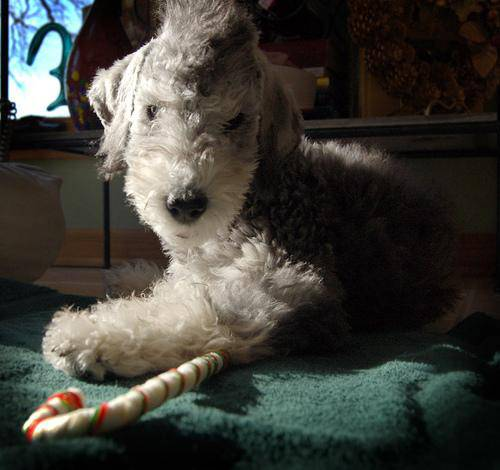

In [5]:
# To view image in notebook
from IPython.display import Image
Image("drive/My Drive/kaggle/train/00290d3e1fdd27226ba27a8ce248ce85.jpg")

### Read and view images from train data
* To read and view images, we need the filenames in format of train directory path concatenated with
id from labels.csv and .jpg

In [6]:
train_path = 'drive/My Drive/kaggle/train/'
train_filenames = [train_path + fname + ".jpg" for fname in labels_csv["id"]]
train_filenames[:10]


['drive/My Drive/kaggle/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/kaggle/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/kaggle/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/kaggle/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/kaggle/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/kaggle/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/kaggle/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/kaggle/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/kaggle/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/kaggle/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

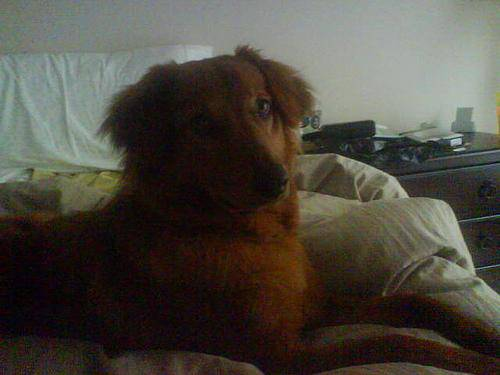

In [6]:
Image(train_filenames[1000])

### Labels for train data
* For labels, we need to create numpy array of boolean labels.
* such that false for all other unique labels and true for the actual label. 

In [7]:
labels_array = labels_csv["breed"].to_numpy()
labels_array[:2]

array(['boston_bull', 'dingo'], dtype=object)

In [10]:
len(labels_array)

10222

In [8]:
unique_labels = np.unique(labels_array)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [9]:
boolean_labels = [label== unique_labels for label in labels_array]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [10]:
# first we will train on 1000 images and increase later
NUM_IMAGES = 1000 #@param {type:"slider" , min: 1000 , max: 10000, step:1000}

### Split data into train and validation sets 

In [11]:
from sklearn.model_selection import train_test_split
X = train_filenames
y = boolean_labels

X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES], #1st 100 images
                                                     y[:NUM_IMAGES],
                                                     test_size=0.2,random_state=42)

len(X_train) , len (X_val) , len(y_train) , len(y_val)

(800, 200, 800, 200)

## PREPARE IMAGES
* Images must be converted into tensors(numpy array type)
* Images must be in a shape that model of tensorflow hub can take.

In [12]:
IMG_SIZE = 224
def process_image(filename, img_size = IMG_SIZE):
  """
  Take image as input and convert them into tensors.
  """
  #read image file
  image = tf.io.read_file(filename)  #read the file

  #convert image to tensor
  image = tf.image.decode_jpeg(image,channels=3)  #convert file into tensor with 3 color channels

  #convert array numbers so that it contains numbers in range of 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)  # convert tensor so that it contains numbers in 0-1 range

  #resize image to shape model can take
  image = tf.image.resize(image, size=[img_size,img_size]) #resize the image according to the model of tensorflow hub

  return image


In [13]:
# call to test image
image = process_image(X[20])
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.4686362 , 0.48284388, 0.4388923 ],
        [0.43491846, 0.46069017, 0.4125102 ],
        [0.45447832, 0.4979307 , 0.44302875],
        ...,
        [0.43456125, 0.5049195 , 0.28860298],
        [0.39823228, 0.4980573 , 0.26960978],
        [0.37409884, 0.48390275, 0.24988663]],

       [[0.43431306, 0.46279556, 0.4211807 ],
        [0.43068317, 0.4688092 , 0.42564145],
        [0.45039746, 0.49808303, 0.45071962],
        ...,
        [0.43917897, 0.51070905, 0.3056251 ],
        [0.3906706 , 0.4944172 , 0.2534024 ],
        [0.34645557, 0.4601811 , 0.20911317]],

       [[0.41501755, 0.4622952 , 0.4238247 ],
        [0.40084037, 0.4505865 , 0.40968493],
        [0.44426945, 0.4941148 , 0.45284492],
        ...,
        [0.4272146 , 0.50133634, 0.31526017],
        [0.38620418, 0.48767138, 0.25313336],
        [0.33333334, 0.44705886, 0.19360997]],

       ...,

       [[0.8738844 , 0.8699628 , 0.8621197 ],
        [0.84

In [14]:
#Model takes combination of image and label as a tuple

def get_tensor_tuple(filename,label):
  """
  get images and labels in the form of tensor tuples.
  """
  image = process_image(filename) #convert image to tensor
  return (image,label)


### CONVERT DATA INTO BATCHES
* In order to work efficiently with our model, we pass data in the form of tensor dataset batches.
* According to Yan lecun , batch size of 32 is recommended.

In [15]:
BATCH_SIZE = 32

def create_data_batches (X , y=None , batch_size = BATCH_SIZE , val_data = False , test_data = False):
  """
  Create data batches of batch size 32. If train data then shuffle and take labels as well.
  If test data then no labels.
  """
  if test_data == True:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #convert the data into tensor dataset
    data_batch = data.map(process_image).batch(batch_size) #apply function on data set and convert into batch
    return data_batch
  elif val_data == True:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_tensor_tuple).batch(batch_size)
    return data_batch
  
  else:
    print("creating train data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))  # train data so we shuffle every time
    data_batch = data.map(get_tensor_tuple).batch(batch_size)
    return data_batch

In [16]:
#call function and create train and valid data batches
train_batch = create_data_batches(X_train,y_train)
val_batch = create_data_batches(X_val,y_val,val_data=True)

creating train data batches..
creating validation data batches...


In [17]:
train_batch.element_spec , val_batch.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualize train and valid data batches
* Function takes the train or valid batch as an input.
* Function first unbatches batched data into separate list of image and labels.
* It will plot first 25 images and their corresponding labels.

In [18]:
def plot_25_images(data_batch):
  """
  plot 25 images from a data batch with their labels.
  """
  images = []
  labels = []
  for image,label in data_batch.unbatch().as_numpy_iterator(): #unbatch data batch and store in lists
    images.append(image)
    labels.append(label)
  plt.figure(figsize=(20,20))
  for i in range(25):
    plt.subplot(5,5,i+1) # 5 rows , 5 columns and ith index
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax(0)]) #since boolean_label, and we want actual label
    plt.axis("off") #no need of axis numbers

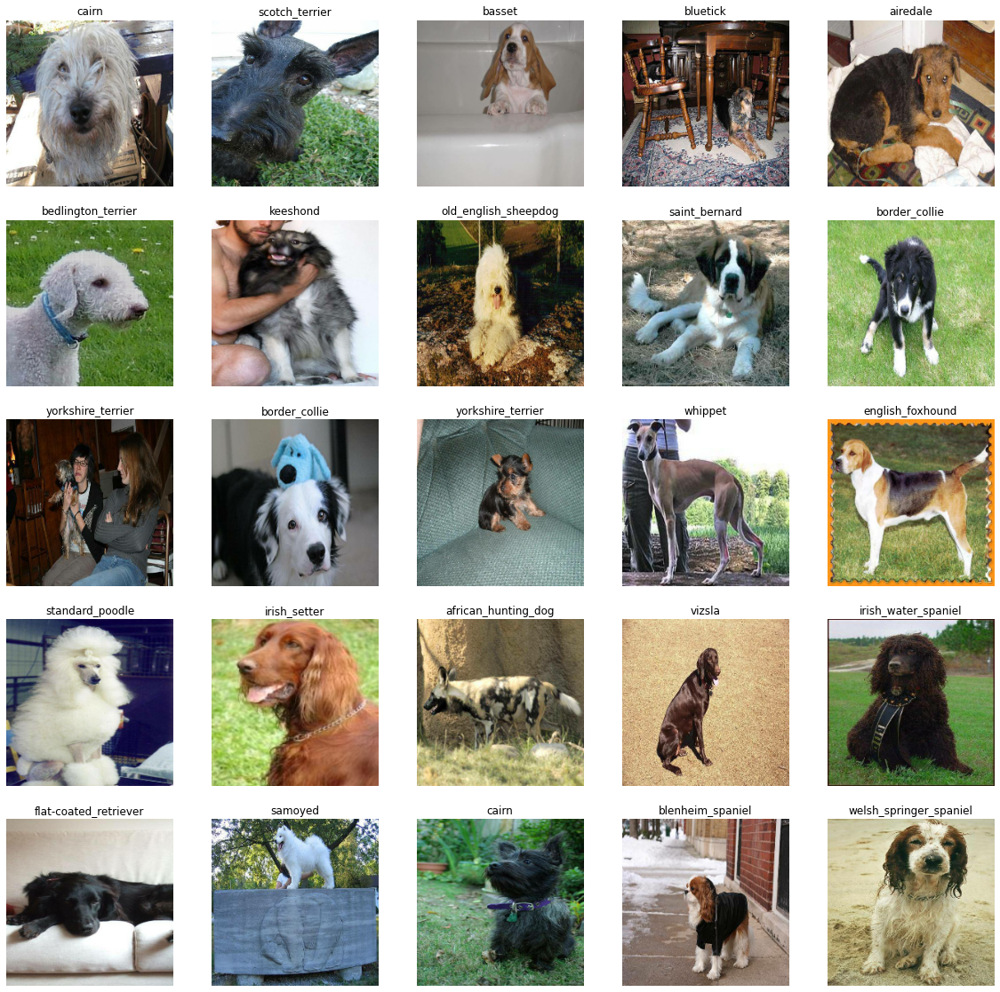

In [44]:
plot_25_images(val_batch)

## BUILD TRANSFER LEARNING MODEL
* We will use 'imagenet/mobilenet_v2_035_224/classification' model from tensor flow hub.
* need to provide input shape , output shape and the model url to use.

In [19]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]  #same as batch data shape

OUTPUT_SHAPE = len(unique_labels)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

### Model building function
* we will build a keras sequential model.
* Model will take the input shape and output shape as layers.
* use softmax as activation function
* use Adam as optimizer and CategoricalCrossentropy for loss.
* use accuracy for metrics

In [20]:
def create_model(input_shape = INPUT_SHAPE , output_shape = OUTPUT_SHAPE , model_url = MODEL_URL):
  """
  create a keras sequential model by taking input shape, output shape and model url from tensor flow hub.
  """
  model = tf.keras.Sequential([hub.KerasLayer(model_url), #1st layer as input shape
                               tf.keras.layers.Dense(units=output_shape,activation="softmax")]) #output layer

  #compile model
  model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ["accuracy"])
  
  #build model
  model.build(input_shape)

  return model

In [122]:
# check model creation by calling function
model = create_model()
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_7 (KerasLayer)   (None, 1001)              5432713   
_________________________________________________________________
dense_7 (Dense)              (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## TRAIN MODEL ON TRAIN DATA (1000 images)


### CALLBACKS
* To train the model on training data, first callbacks need to be setup.
* Callbacks are helper funtions to track model progress
and to stop model from training if a certain metric stops improving or if a model is training for too long.
* Tensorboard callback is used to track model progress.
* Earlystopping callback is used to stop model training.

### Tensorboard callback
* load the tensor board notebook extension
* create tensorboard callback function which creates logs in logs directory.

In [21]:
#load tensorborad notebook extension
%load_ext tensorboard

In [22]:
#function to create tensorboard logs in logs directory
import datetime
import os
def create_tensorboard_callback():
  """
  create a tensorboard log in logs directory.
  """
  logdir = os.path.join("drive/My Drive/kaggle/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) #create logs folder with timestamp
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [24]:
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", #check validation accuracy of model
                                                           patience=3) # no of epochs

### Function to train model
* This function will first create model using `create_model()`
* create tensorboard callback using `create_tensorboard_callback()`
* fit the model on train data using `fit()`
* fit will take train data batch, vaidation batch and num of epochs.

In [25]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10 , max:100 , step:10}

In [26]:
def train_model():
  """
  train model by creating model and fit model on train data and return trained model.
  """

  #create model
  model = create_model()

  #create tensorboard callback
  tensorboard_callback = create_tensorboard_callback()

  #fit the model
  model.fit(x=train_batch,
            epochs=NUM_EPOCHS,
            validation_data=val_batch,
            validation_freq=1,
            callbacks=[tensorboard_callback,early_stopping_callback])
  
  #return fitted model
  return model

In [126]:
model = train_model()

Epoch 1/100
 2/25 [=>............................] - ETA: 7s - loss: 5.9634 - accuracy: 0.0000e+00WARNING:tensorflow:Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1319s vs `on_train_batch_end` time: 0.5570s). Check your callbacks.


25/25 [==============================] - 9s 342ms/step - loss: 4.5864 - accuracy: 0.1063 - val_loss: 3.4277 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 6s 257ms/step - loss: 1.6495 - accuracy: 0.6637 - val_loss: 2.1573 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 7s 265ms/step - loss: 0.5606 - accuracy: 0.9400 - val_loss: 1.6836 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 6s 248ms/step - loss: 0.2433 - accuracy: 0.9937 - val_loss: 1.4787 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 6s 244ms/step - loss: 0.1424 - accuracy: 0.9975 - val_loss: 1.3980 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 6s 248ms/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.3599 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================] - 6s 249ms/step - loss: 0.0751 - accuracy: 1.0000 - val_loss: 1.3395 - val_accuracy: 0.6250
Epoch 8/100

In [27]:
#check tensorboard logs
%tensorboard --logdir drive/My\ Drive/kaggle/logs

<IPython.core.display.Javascript object>

## MAKING PREDICTIONS ON VALID DATA
* Predcitions can be made by using `predict()`
* `predict()` returns a numpy array of prediction probabilities for each class.

In [128]:
val_predictions = model.predict(val_batch,verbose=1)
val_predictions[1]

7/7 [==============================] - 1s 166ms/step


array([3.49975540e-04, 2.70059099e-04, 7.86444172e-03, 1.49928709e-03,
       3.14369856e-04, 3.13447017e-05, 1.41028063e-02, 3.01652297e-04,
       8.45299583e-05, 4.55725385e-04, 1.60900410e-03, 9.88131433e-06,
       1.19918077e-04, 4.04125931e-05, 1.94635559e-05, 2.38941666e-05,
       2.37909728e-03, 7.99004163e-04, 6.37249541e-05, 9.60096004e-05,
       2.69334298e-04, 1.09661050e-04, 4.38887910e-05, 3.28643546e-05,
       3.32625605e-05, 6.34394746e-05, 8.86299908e-02, 7.41262571e-04,
       6.85852719e-05, 1.28916159e-04, 3.17571357e-05, 2.16447865e-04,
       3.37549223e-04, 1.06212654e-04, 3.86307183e-05, 1.17920863e-04,
       1.50967258e-04, 9.33658052e-03, 1.04378872e-04, 4.28478270e-05,
       6.43383391e-05, 1.29697350e-04, 4.01714526e-04, 2.65316863e-04,
       4.93724248e-04, 9.09791153e-04, 5.16785309e-04, 3.66896638e-05,
       6.64264858e-02, 6.97906071e-05, 2.18035042e-04, 3.77192715e-04,
       3.79249400e-06, 8.33402373e-05, 4.66924510e-04, 3.02855321e-03,
      

In [129]:
i = 1
print(f"predictions probabilities:{val_predictions[i]}")
print(f"maximum prediction probability: {np.max(val_predictions[i])}")
print(f"sum of probabilities:{np.sum(val_predictions[i])}")
print(f"index of maximum probability:{np.argmax(val_predictions[i])}")
print(f"predicted label:{unique_labels[np.argmax(val_predictions[i])]}")

predictions probabilities:[3.49975540e-04 2.70059099e-04 7.86444172e-03 1.49928709e-03
 3.14369856e-04 3.13447017e-05 1.41028063e-02 3.01652297e-04
 8.45299583e-05 4.55725385e-04 1.60900410e-03 9.88131433e-06
 1.19918077e-04 4.04125931e-05 1.94635559e-05 2.38941666e-05
 2.37909728e-03 7.99004163e-04 6.37249541e-05 9.60096004e-05
 2.69334298e-04 1.09661050e-04 4.38887910e-05 3.28643546e-05
 3.32625605e-05 6.34394746e-05 8.86299908e-02 7.41262571e-04
 6.85852719e-05 1.28916159e-04 3.17571357e-05 2.16447865e-04
 3.37549223e-04 1.06212654e-04 3.86307183e-05 1.17920863e-04
 1.50967258e-04 9.33658052e-03 1.04378872e-04 4.28478270e-05
 6.43383391e-05 1.29697350e-04 4.01714526e-04 2.65316863e-04
 4.93724248e-04 9.09791153e-04 5.16785309e-04 3.66896638e-05
 6.64264858e-02 6.97906071e-05 2.18035042e-04 3.77192715e-04
 3.79249400e-06 8.33402373e-05 4.66924510e-04 3.02855321e-03
 3.40771221e-05 6.79892581e-03 2.47126649e-04 4.26844275e-03
 4.88846679e-04 5.16582077e-06 1.08995273e-05 2.61928624e-0

### Function to turn probabilities into labels.

In [28]:
def get_predicted_label(predictions):
  """
  convert prediction probability to a label and return.
  """
  return unique_labels[np.argmax(predictions)]

In [131]:
get_predicted_label(val_predictions[1])

'miniature_schnauzer'

### Unbatch data
* We can unbatch the batched data using `unbatch()`
* after unbatch we have to use `as_numpy_iterator()` so as to fetch images and labels

In [29]:
def unbatch_data(data,labels=True):
  """
  unbatch the batched data and return images and labels.
  If no labels as in test data, use labels=False.
  """
  images = []
  labels = []
  if labels == False:
    for image in data.unabtch().as_numpy_iterator():
      images.append(image)
    return images
  else:
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_labels[np.argmax(label)])
    return images, labels

In [30]:
val_images , val_labels = unbatch_data(val_batch)
val_labels[0]

'cairn'

### Compare prediction with actual labels

In [135]:
val_labels[7] , get_predicted_label(val_predictions[7])

('old_english_sheepdog', 'old_english_sheepdog')

### VISUALIZE PREDICTIONS
* make a function to visualize the image , actual label and the predicted label
and the prediction probability.
* Function takes the predictions array , validation images and labels and an integer as an input.

In [156]:
def plot_predictions(predictions, labels , images , n=1):
  """
  plot the image and their actual and predicted labels.
  Labels color is green if actual and predicted label are matched else red.
  """
  pred_prob , true_label , image = predictions[n] , labels [n] , images[n]

  #get predicted label
  pred_label = get_predicted_label(pred_prob)

  #change color
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  #Plot image
  plt.imshow(image)
  plt.axis("off")

  #change title
  plt.title("{} {:2.0f}% {}".format(true_label,
                                    np.max(pred_prob)*100,
                                    pred_label),
            color = color)

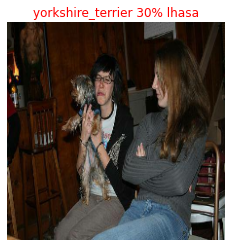

In [157]:
# plot and check an image
plot_predictions(val_predictions,
                 val_labels,
                 val_images,
                 n=10)

### Function to plot top 10 predictions
* This function takes predictions array,and true labels and integer as an input.
* It will plot the top 10 predictions and turn the color of actual label to green.

In [164]:
def plot_pred_conf(predictions , labels , n=1):
  """
  plot top 10 predictions as a bar plot.
  change pediction color to green if predicted label is equal to actual label.
  """
  pred_prob , true_label = predictions[n] , labels[n]

  #get top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #get top 10 predictions
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #get top 10 labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  #setup top plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  
  #set x-axis as labels
  plt.xticks(np.arange(len(top_10_pred_labels)),
                  top_10_pred_labels,
             rotation="vertical")
  
  #change color
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

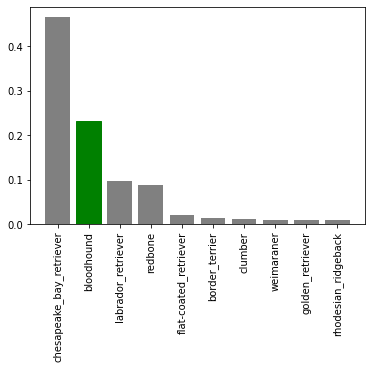

In [165]:
plot_pred_conf(val_predictions,
               val_labels,
               n=100)

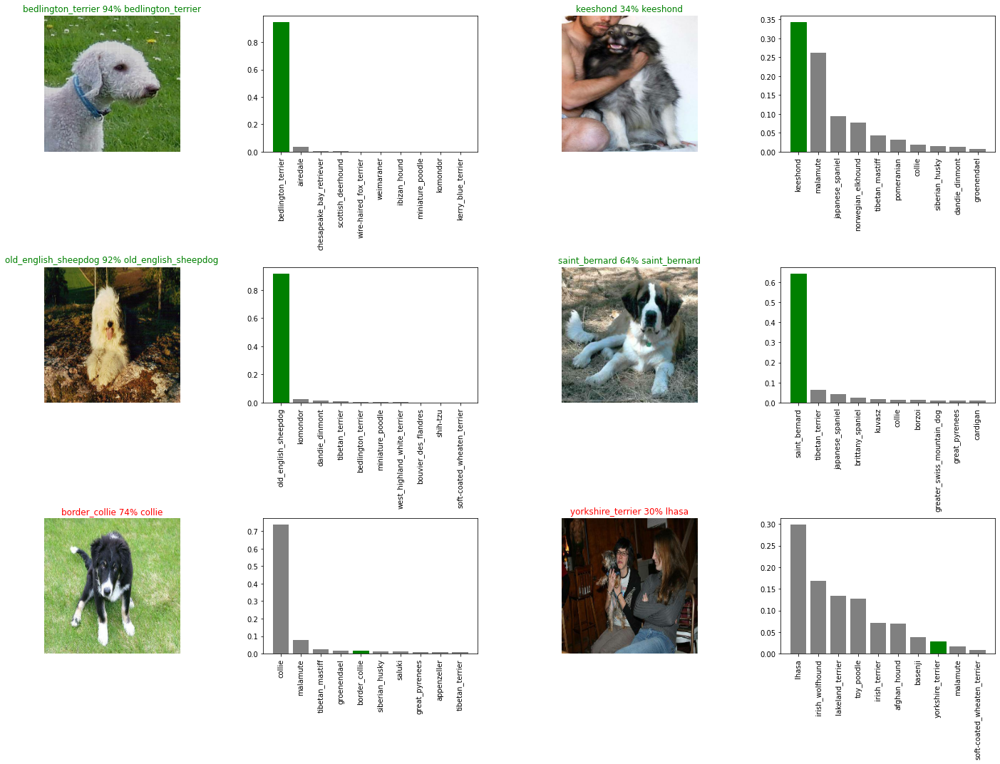

In [168]:
### PLot probabilities and images together
i_multiplier = 5  #it can be changed to change images on plot
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols , 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_predictions(val_predictions,val_labels,val_images , n=i+i_multiplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(val_predictions,val_labels,n=i+i_multiplier)
      
plt.tight_layout(h_pad=1.0)
plt.show()

## SAVING AND LOADING TRAINED MODELS

### Save a trained model
* To save a model we create a function that takes model and a suffix as input.
* Function will save the model and return the path of directory to which it is saved.

In [31]:
def save_model(model,suffix=None):
  """
  save a model and return the path to which it is saved.
  """
  modeldir = os.path.join("drive/My Drive/kaggle/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + '-'+ suffix + ".h5" #extension to save model
  model.save(model_path)
  return model_path

In [170]:
#call to save model
save_model(model,suffix="imagenetV2_1000images")

'drive/My Drive/kaggle/models/20200809-161900-imagenetV2_1000images.h5'

### Load a saved model
* Loading a saved model, function takes the path of saved model.
* returns the loaded model

In [32]:
def load_saved_model(model_path):
  """
  load a saved model from a path.
  """
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [174]:
# load model
loaded_model = load_saved_model('drive/My Drive/kaggle/models/20200809-161900-imagenetV2_1000images.h5')
loaded_model

### Compare loaded model with actual model

In [175]:
model.evaluate(val_batch)

7/7 [==============================] - 1s 147ms/step - loss: 1.2537 - accuracy: 0.6650


[1.2536768913269043, 0.6650000214576721]

In [177]:
loaded_model.evaluate(val_batch)

7/7 [==============================] - 1s 145ms/step - loss: 1.2537 - accuracy: 0.6650


[1.2536768913269043, 0.6650000214576721]

## TRAIN MODEL ON FULL DATA
* To train model on full data:
1. input train data must be in batch format
2. create full model using `create_model()`
3. create callbacks for full model
4. fit the model on full train data 

In [33]:
# 1. create train data batches
full_data = create_data_batches(X,y)
full_data.element_spec

creating train data batches..


(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [180]:
# 2. create full model
full_model = create_model()

In [181]:
#3. create callbacks
full_tensorboard_callback = create_tensorboard_callback()
full_early_stop = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                   patience=3)

In [183]:
#4. fit model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_tensorboard_callback,full_early_stop])
save_model(full_model,suffix="full-imageset-mobilenetv2")

Epoch 1/100
320/320 [==============================] - 7658s 24s/step - loss: 1.3285 - accuracy: 0.6717
Epoch 2/100
320/320 [==============================] - 58s 180ms/step - loss: 0.4045 - accuracy: 0.8785
Epoch 3/100
320/320 [==============================] - 58s 181ms/step - loss: 0.2350 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 58s 180ms/step - loss: 0.1517 - accuracy: 0.9654
Epoch 5/100
320/320 [==============================] - 57s 178ms/step - loss: 0.1093 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 57s 178ms/step - loss: 0.0764 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 57s 178ms/step - loss: 0.0570 - accuracy: 0.9932
Epoch 8/100
320/320 [==============================] - 58s 181ms/step - loss: 0.0465 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 57s 178ms/step - loss: 0.0375 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 58s 180m

'drive/My Drive/kaggle/models/20200809-190940-full-imageset-mobilenetv2.h5'

In [34]:
loaded_full_model = load_saved_model('drive/My Drive/kaggle/models/20200809-190940-full-imageset-mobilenetv2.h5')
loaded_full_model

## MAKING PREDICTIONS ON TEST DATA
* To make predictions on test data, it should be int the same format as train data that is tensor batches.
* Take filenames of images in a list.
* call `create_data_batches()` to create data bathes.
* make predictions on test data batch using 'predict()'

In [36]:
# test data filenames
test_path = 'drive/My Drive/kaggle/test/'
test_filenames = [test_path+ fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/kaggle/test/ebe58f64e95c071d30eaceb907b7375c.jpg',
 'drive/My Drive/kaggle/test/f47e4614a5d7d190cf95b4b9c1e78576.jpg',
 'drive/My Drive/kaggle/test/e9ef6c9f1a1ad34c42b6595c18f164e2.jpg',
 'drive/My Drive/kaggle/test/ea8fab5f4003724ac49ea787216998b1.jpg',
 'drive/My Drive/kaggle/test/e90d5b1d2617510402f3620721f7c526.jpg',
 'drive/My Drive/kaggle/test/e917abf625ad6ba5b8a0e59bd23e8818.jpg',
 'drive/My Drive/kaggle/test/f367afa19bb30234fafa16c64b3730f0.jpg',
 'drive/My Drive/kaggle/test/f0e6e1a934316bb94a6a1eeba894e32e.jpg',
 'drive/My Drive/kaggle/test/ed77c2de9938730ef8e9d11c718dda38.jpg',
 'drive/My Drive/kaggle/test/e9d1478e035f22b0cf94be580d620f80.jpg']

In [37]:
# create test data batches
test_batch = create_data_batches(test_filenames,test_data=True)
test_batch.element_spec

creating test data batches...


TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

In [38]:
# predictions on test data
test_predictions = loaded_full_model.predict(test_batch,
                                             verbose=1)

324/324 [==============================] - 7902s 24s/step


In [39]:
test_predictions[:2]

array([[1.10259588e-11, 1.56861798e-11, 2.76219377e-11, 9.18187401e-11,
        1.05548372e-06, 1.28101366e-11, 7.67671260e-09, 9.23435717e-10,
        1.87124649e-09, 5.15985768e-03, 1.11801649e-12, 4.32652656e-15,
        2.75948355e-06, 8.14015744e-10, 7.27811312e-07, 7.80348842e-07,
        5.36201128e-09, 3.42873641e-09, 1.47457459e-12, 1.37364634e-10,
        1.75692291e-11, 3.11946252e-07, 2.33328856e-10, 2.96800995e-12,
        1.84424742e-08, 6.09563031e-05, 2.02431494e-09, 1.04845299e-10,
        6.03651031e-08, 3.00031076e-08, 9.14377196e-08, 6.88407820e-09,
        7.30044070e-09, 2.87962793e-10, 7.60145336e-10, 8.50025994e-10,
        1.29072963e-09, 1.18506898e-06, 1.86330222e-11, 2.40057852e-06,
        2.20561258e-08, 8.33716568e-11, 1.90827332e-09, 1.36892012e-10,
        4.32575824e-08, 2.40899169e-07, 1.58054316e-08, 3.00867065e-09,
        9.55261148e-11, 2.01393632e-05, 8.85637608e-09, 1.59083925e-07,
        1.21790049e-06, 2.47787398e-07, 3.92409792e-13, 5.006781

In [41]:
#saving predictions numpy array into a csv file
np.savetxt("drive/My Drive/kaggle/test_predictions.csv",test_predictions,delimiter=",")

In [42]:
#loading saved predictions numpy array
loaded_predictions = np.loadtxt("drive/My Drive/kaggle/test_predictions.csv",delimiter=",")

In [44]:
test_predictions.shape

(10357, 120)

In [45]:
loaded_predictions.shape

(10357, 120)

## SUBMITTING PREDICTIONS TO KAGGLE
* Submission to be submitted in format of id and breeds.
* create a data frame with columns
* Add predictions array and file names without extension
* export as csv and submit on kaggle

In [46]:
#create pandas dataframe
pred_df = pd.DataFrame(columns = ["id"]+ list(unique_labels))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [47]:
# filenames without extension
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['ebe58f64e95c071d30eaceb907b7375c',
 'f47e4614a5d7d190cf95b4b9c1e78576',
 'e9ef6c9f1a1ad34c42b6595c18f164e2',
 'ea8fab5f4003724ac49ea787216998b1',
 'e90d5b1d2617510402f3620721f7c526',
 'e917abf625ad6ba5b8a0e59bd23e8818',
 'f367afa19bb30234fafa16c64b3730f0',
 'f0e6e1a934316bb94a6a1eeba894e32e',
 'ed77c2de9938730ef8e9d11c718dda38',
 'e9d1478e035f22b0cf94be580d620f80']

In [48]:
# add filenames to the data frame
pred_df["id"] = test_ids
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ebe58f64e95c071d30eaceb907b7375c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f47e4614a5d7d190cf95b4b9c1e78576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e9ef6c9f1a1ad34c42b6595c18f164e2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ea8fab5f4003724ac49ea787216998b1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e90d5b1d2617510402f3620721f7c526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
#add predictions
pred_df[list(unique_labels)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ebe58f64e95c071d30eaceb907b7375c,1.1026e-11,1.56862e-11,2.76219e-11,9.18187e-11,1.05548e-06,1.28101e-11,7.67671e-09,9.23436e-10,1.87125e-09,0.00515986,1.11802e-12,4.32653e-15,2.75948e-06,8.14016e-10,7.27811e-07,7.80349e-07,5.36201e-09,3.42874e-09,1.47457e-12,1.37365e-10,1.75692e-11,3.11946e-07,2.33329e-10,2.96801e-12,1.84425e-08,6.09563e-05,2.02431e-09,1.04845e-10,6.03651e-08,3.00031e-08,9.14377e-08,6.88408e-09,7.30044e-09,2.87963e-10,7.60145e-10,8.50026e-10,1.29073e-09,1.18507e-06,1.8633e-11,...,1.4789e-09,1.50075e-11,1.86721e-11,8.22329e-09,4.40722e-13,4.79857e-08,9.18739e-11,5.299e-12,1.2555e-06,1.30037e-05,7.65332e-05,3.48138e-07,2.33596e-08,2.08521e-07,1.49864e-14,2.05445e-11,1.61631e-12,1.27896e-10,1.00984e-10,6.59813e-14,8.93874e-08,1.72252e-07,3.1352e-08,1.82991e-12,5.64035e-09,4.15168e-09,1.27108e-09,1.34925e-08,1.23935e-10,4.46684e-11,7.71899e-14,9.01901e-08,3.95017e-07,2.6435e-06,1.12606e-07,1.01404e-10,4.40332e-12,2.02076e-10,4.40776e-10,5.91866e-11
1,f47e4614a5d7d190cf95b4b9c1e78576,6.48922e-13,1.91789e-09,5.09974e-11,0.0314625,1.06543e-06,1.85477e-08,1.77692e-08,2.76394e-12,1.12425e-09,5.89138e-07,3.50729e-09,1.86396e-12,2.95354e-09,3.9869e-11,1.49018e-09,3.3815e-09,1.16756e-10,1.25583e-08,4.29965e-09,2.55609e-13,5.19331e-10,6.22106e-14,5.09657e-10,4.8932e-07,8.40686e-10,3.28314e-12,0.000852957,1.22774e-09,3.52998e-08,1.42211e-10,3.86922e-11,1.40484e-10,3.0025e-09,2.45955e-07,6.18085e-12,2.14752e-06,3.56663e-13,1.80844e-09,4.11143e-08,...,5.77566e-10,1.7703e-07,7.3364e-10,2.62391e-06,8.26146e-14,4.13547e-10,3.7967e-07,4.51126e-11,1.20262e-12,1.03272e-10,8.89537e-09,8.88533e-13,4.0862e-12,8.33262e-08,1.84253e-13,8.14171e-12,5.38129e-09,6.20773e-08,9.88718e-11,4.38572e-10,4.23101e-06,7.72732e-10,9.03678e-09,3.09878e-07,1.67787e-11,1.10671e-10,3.21973e-06,6.8865e-11,1.23646e-14,5.35209e-10,1.61633e-11,6.88329e-09,1.67203e-08,1.04813e-10,5.60813e-12,1.03824e-08,1.70661e-12,3.45168e-07,0.00146454,8.7169e-09
2,e9ef6c9f1a1ad34c42b6595c18f164e2,6.46041e-11,1.40781e-10,2.53324e-11,3.17749e-11,5.38398e-11,6.31256e-11,1.11604e-10,1.70736e-11,1.85083e-10,1.06949e-16,5.43074e-14,4.71883e-11,3.12296e-12,1.15218e-07,9.57994e-14,1.53151e-07,9.94279e-10,5.01646e-17,6.59683e-09,2.66463e-10,3.74395e-13,2.28273e-14,1.28931e-12,1.59644e-18,6.714e-13,9.5064e-11,1.89018e-14,1.79116e-07,5.66434e-10,1.96415e-14,1.33814e-11,4.10049e-10,1.74164e-10,1.14102e-06,3.93154e-13,1.92597e-09,2.06258e-12,7.59687e-12,2.399e-11,...,1.04281e-12,1.51447e-12,1.19334e-07,2.81094e-08,1.87848e-10,3.63822e-08,4.55451e-16,3.07744e-14,2.11407e-09,1.11484e-11,7.87291e-10,1.6162e-07,2.2595e-09,5.57657e-06,1.11956e-06,2.12397e-11,2.93006e-11,5.20154e-08,2.69439e-10,6.26282e-12,8.04315e-10,2.53702e-10,2.07231e-09,2.19932e-09,1.53125e-14,4.54032e-13,2.67343e-07,2.29561e-12,1.16985e-07,0.00459066,1.70636e-11,1.11828e-12,9.68388e-15,3.7969e-09,4.08648e-09,2.6271e-10,2.10458e-0

In [50]:
# export to csv
pred_df.to_csv("drive/My Drive/kaggle/final_submission.csv",index=False)